# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
import skimage.feature as feature
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


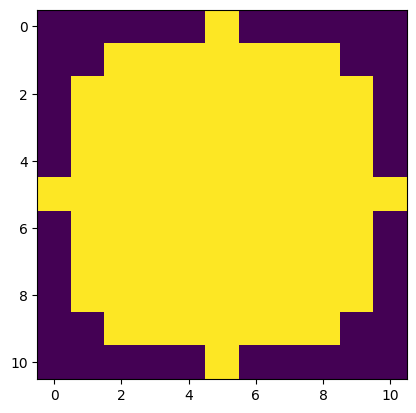

In [2]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1 1 1 1]
 [1 1 1 1 1]]


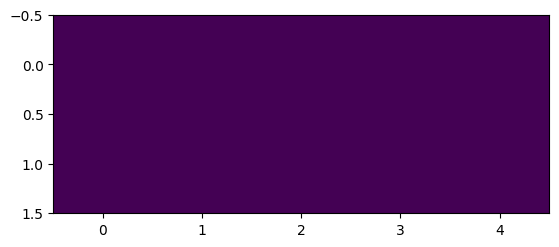

In [3]:
def line_strell(width,length):
  if student :
    strell = morpho.rectangle(width,length)
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

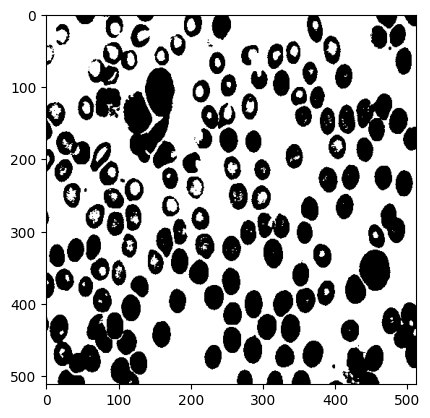

In [4]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  # Apply the threshold to the image
  binary_image = img > 150
  plt.imshow(binary_image, cmap='gray')
  plt.show()
  # Theresholding and display

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [5]:
strell = morpho.disk(5)

img_erosion = morpho.erosion(binary_image, strell)
img_dilation = morpho.dilation(binary_image, strell)
img_opening = morpho.opening(binary_image, strell)
img_closing = morpho.closing(binary_image, strell)


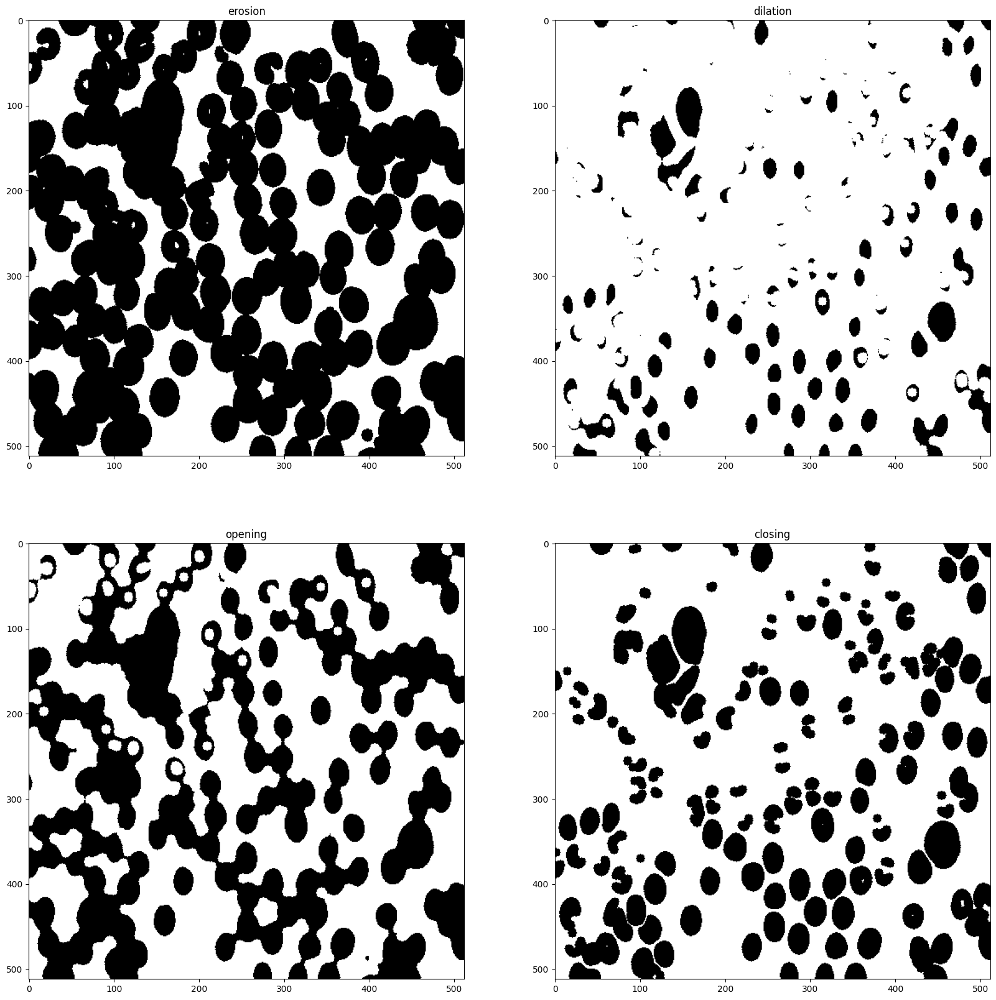

In [6]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
imgs = [img_erosion,img_dilation,img_opening,img_closing] # Add in this list the 4 images, obtained with the four operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()



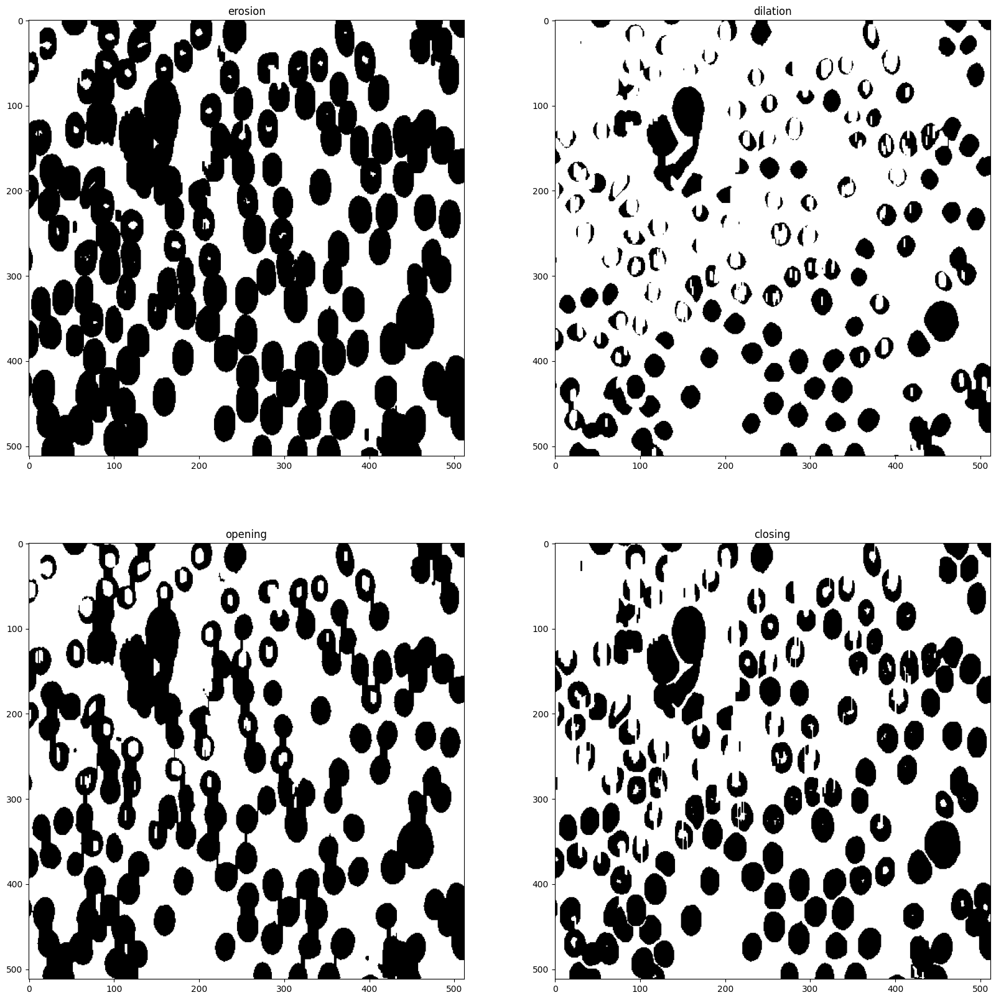

In [7]:
# try your own structuring elements and make the size vary
if student :
  strell = line_strell(10,2)

  img_erosion = morpho.erosion(binary_image, strell)
  img_dilation = morpho.dilation(binary_image, strell)
  img_opening = morpho.opening(binary_image, strell)
  img_closing = morpho.closing(binary_image, strell)

  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [img_erosion,img_dilation,img_opening,img_closing] # Add in this list the 4 images, obtained with the four operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **Q** : What is the influence of the size of the structuring element ?
- **A** : The shape of the structuring element used in morphological operations like erosion, dilation, opening, and closing can significantly influence the results of these operations. Different shapes and sizes of structuring elements will lead to varying degrees of image erosion and dilation, and they may selectively affect different parts of an image. When performing opening and closing, the choice of structuring element shape will determine the extent of detail preserved or lost during the combined erosion and dilation steps, ultimately impacting the desired outcome of the morphological operation in image processing.


### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


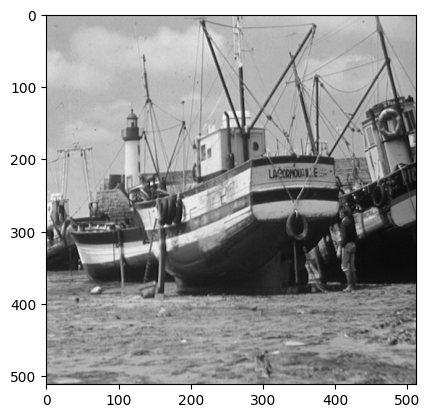

In [8]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

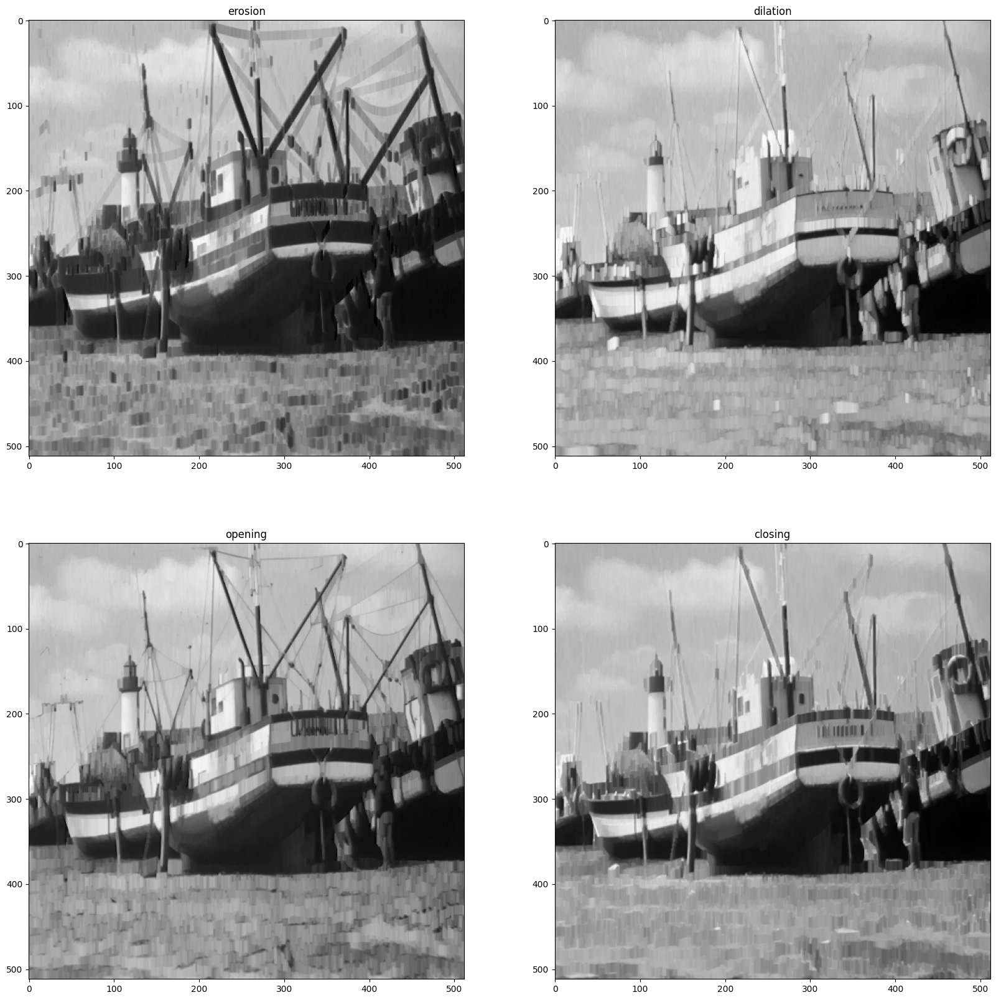

In [9]:
if student:
  ### start code
  strell = line_strell(10,2)

  img_erosion = morpho.erosion(img, strell)
  img_dilation = morpho.dilation(img, strell)
  img_opening = morpho.opening(img, strell)
  img_closing = morpho.closing(img, strell)

  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [img_erosion,img_dilation,img_opening,img_closing] # Add in this list the 4 images, obtained with the four operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : The shape and size parameters of the structuring element significantly influence morphological operations such as erosion and dilation. The shape determines which features are emphasized, with different shapes highlighting specific structures, while the size controls the spatial extent of the operation, affecting the level of detail preserved or lost. The combined choice of shape and size allows customization for specific image processing needs, enabling the enhancement or suppression of particular features, details, or structures in the grayscale image, depending on the objectives of the task.

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : This demonstrates the iterativity property in morphological operations, where sequential applications of the same operation using smaller structuring elements cumulatively expand objects and fill in gaps between them. The final result with the size 5 disk structuring element will have a similar effect, expanding objects and filling gaps, albeit with slightly different degrees of enlargement and gap closure depending on the sizes used.

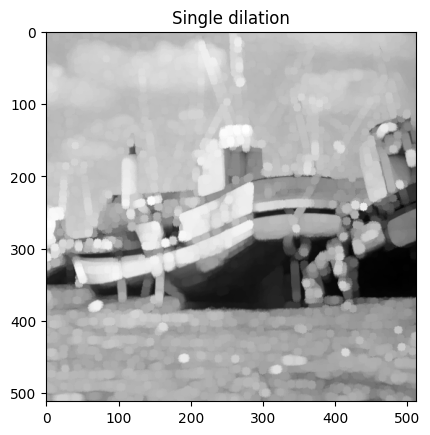

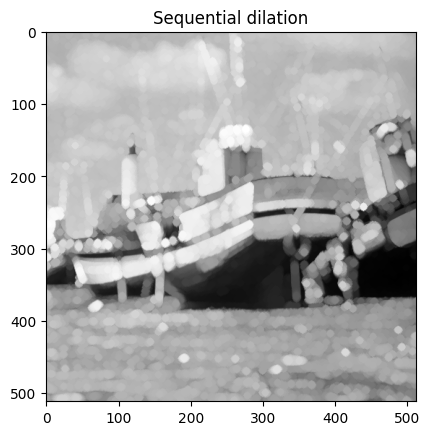

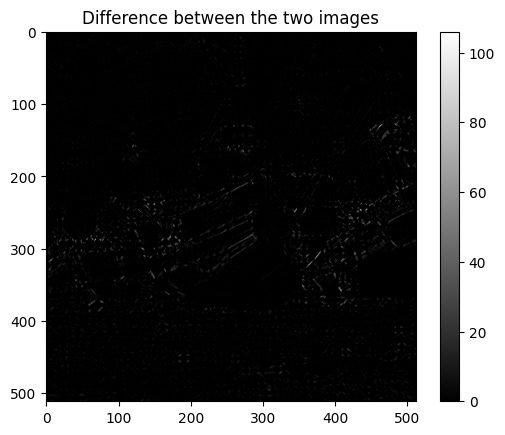

195761


In [10]:
if student:
  ### start code
  strell = morpho.disk(5)

  dilation = morpho.dilation(img,strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(3)),morpho.disk(2))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.


[[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 1 1 1 1 1 0 0 0 0]
 [0 0 0 1 1 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 1 1 0 0 0]
 [0 0 0 0 1 1 1 1 1 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]


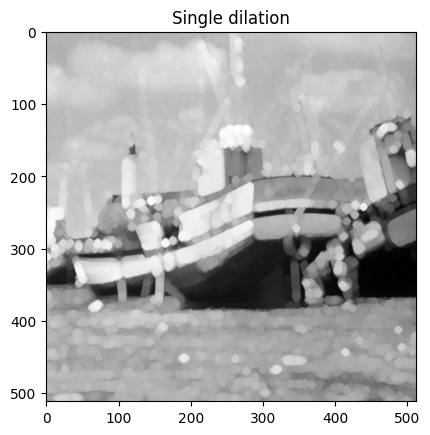

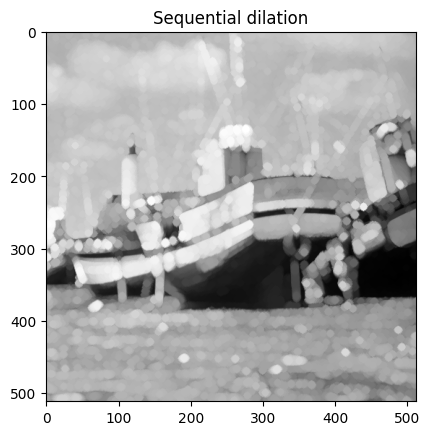

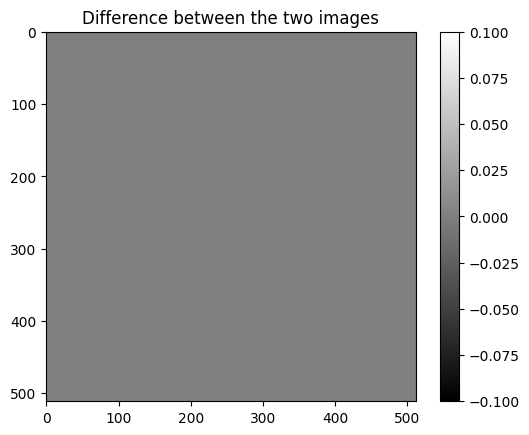

0


In [11]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell, 4, mode='constant')
  sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


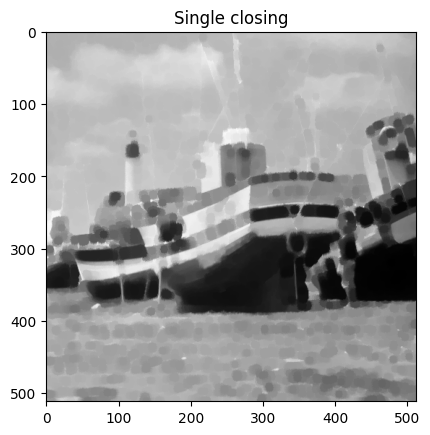

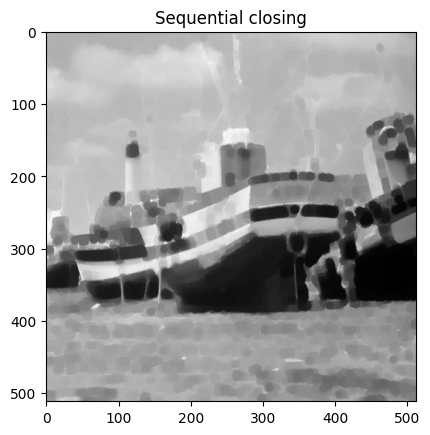

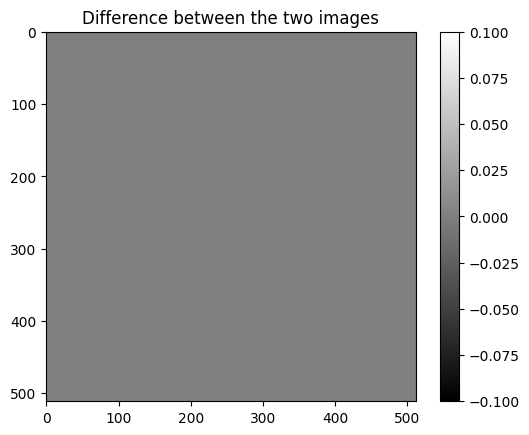

0


In [12]:
if student :
  ### start code
  # Perform closing multiple times
  strell = morpho.disk(5)

  # Use it to perform the image closing
  closing = morpho.closing(img,strell)
  plt.imshow(closing,cmap = "gray")
  plt.title("Single closing")
  plt.show()
  
  # Compare it with the sequential closing
  sequential_closing = morpho.closing(morpho.closing(img, strell),strell)
  plt.imshow(sequential_closing,cmap = "gray")
  plt.title("Sequential closing")
  plt.show()
    
  plt.imshow(closing-sequential_closing,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(closing-sequential_closing)))
  ### end code

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : Performing a top-hat transform involves taking the difference between an image and its opening, which highlights local variations or small structures in the image. The choice of the structuring element in the top-hat transform can significantly impact the results. A larger structuring element will emphasize larger-scale variations in the image, while a smaller one will highlight finer details. For instance, using a square or rectangular structuring element might emphasize horizontal and vertical structures, while a circular one will emphasize more circular or rounded features. The choice of the structuring element should align with the specific features or patterns you want to detect or emphasize in the image. Overall, the top-hat transform is a valuable tool for enhancing and revealing particular details in an image, and the selection of the structuring element plays a critical role in this process.

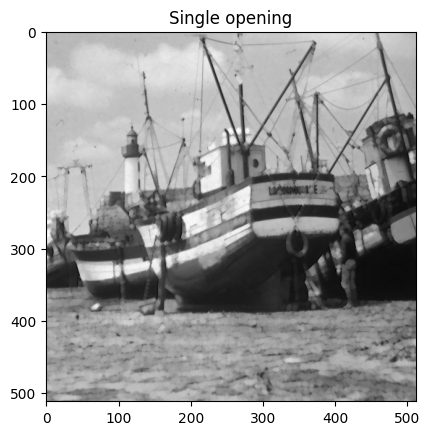

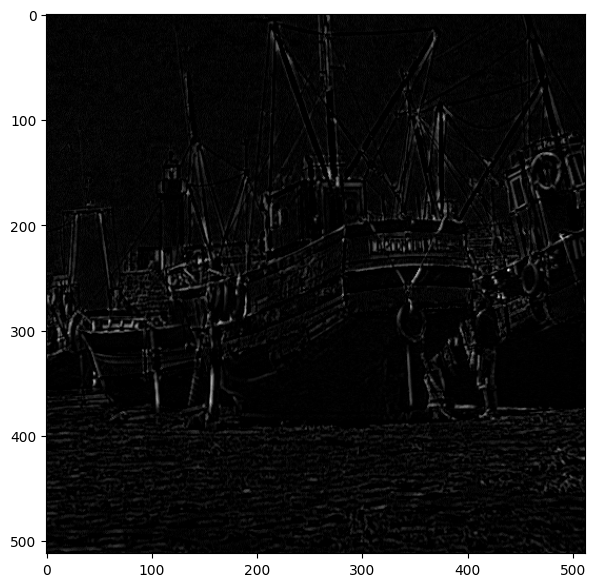

In [13]:
if student:
  ### start code
  strell = morpho.disk(2)

  # Use it to perform the image closing
  opening = morpho.opening(img,strell)
  plt.imshow(opening,cmap = "gray")
  plt.title("Single opening")
  plt.show()

  top_hat = img - opening
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : Performing a dual top-hat transform involves taking the difference between the closing of an image and the image itself, highlighting variations in the image at a scale larger than the structuring element. The choice of the structuring element influences the result significantly. A larger structuring element will emphasize broader structures and features, potentially removing smaller details and noise. Conversely, a smaller structuring element may bring out finer details, but it could be sensitive to noise. The selection of the structuring element should align with the specific patterns or structures you aim to emphasize or detect. In summary, the dual top-hat transform is a powerful tool for enhancing larger-scale features in an image, and the structuring element choice should be guided by the characteristics of the image and the desired emphasis or detection of specific structures.

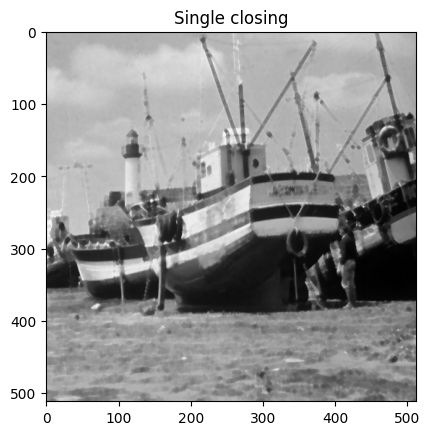

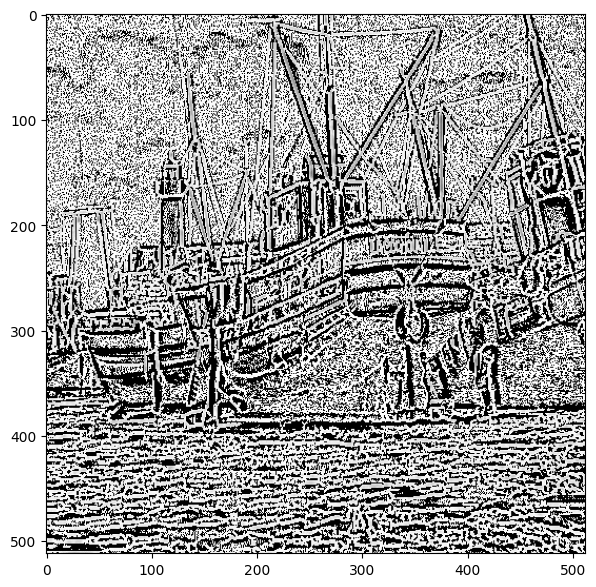

In [14]:
if student:
  ### start code
  strell = morpho.disk(2)

  # Use it to perform the image closing
  closing = morpho.closing(img,strell)
  plt.imshow(closing,cmap = "gray")
  plt.title("Single closing")
  plt.show()

  dual_top_hat = img - closing

plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: Performing alternate sequential filters, such as sequential opening and closing with structuring elements of varying sizes, can result in a selective filtering process in an image. Smaller structuring elements, like squares of radius 1 or 2, tend to emphasize finer details, noise reduction, and edge enhancement. Larger structuring elements, such as those with a radius of 3 to 5, target broader structures and may lead to more substantial smoothing and feature simplification. The choice of structuring element size and sequence allows for a balance between preserving finer details and reducing noise while smoothing larger structures, making these operations valuable for image enhancement and noise reduction in various image processing applications. Customized combinations enable tailored filtering to suit specific image characteristics and analysis requirements.

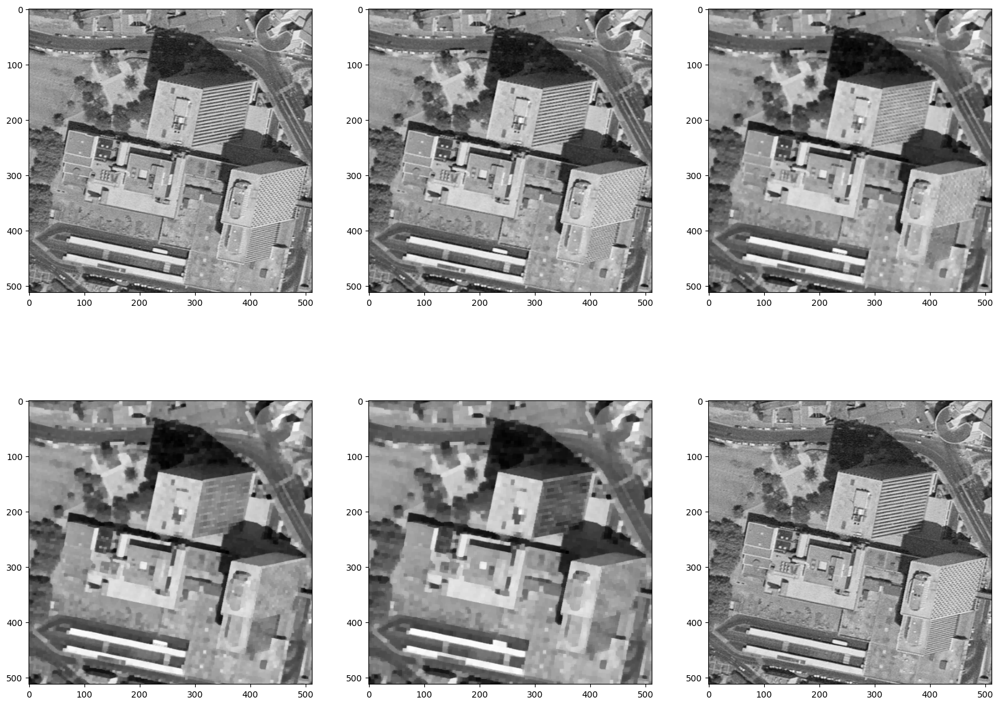

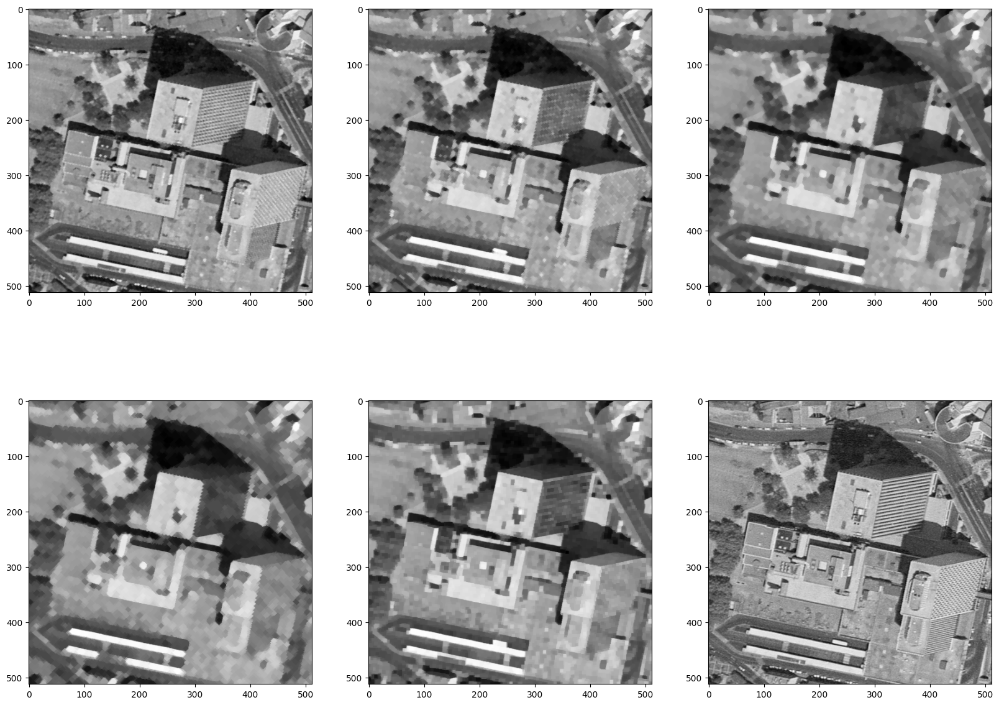

In [15]:
# Example
img = skio.imread("images/montreuil.tif")

# Structuring elements
se1= morpho.square(1)
se2= morpho.square(2)
se3= morpho.square(3)
se4= morpho.square(4)
se5= morpho.square(5)

# Images
fas1= morpho.closing(morpho.opening(img,se1),se1)
fas2= morpho.closing(morpho.opening(img,se2),se2)
fas3= morpho.closing(morpho.opening(img,se3),se3)
fas4= morpho.closing(morpho.opening(img,se4),se4)
fas5= morpho.closing(morpho.opening(img,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  # Structuring elements
  se1= morpho.disk(1)
  se2= morpho.diamond(2)
  se3= morpho.disk(3)
  se4= morpho.diamond(4)
  se5= morpho.square(5)

  # Images
  fas1= morpho.closing(morpho.opening(img,se1),se1)
  fas2= morpho.closing(morpho.opening(img,se2),se2)
  fas3= morpho.closing(morpho.opening(img,se3),se3)
  fas4= morpho.closing(morpho.opening(img,se4),se4)
  fas5= morpho.closing(morpho.opening(img,se5),se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")
  plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) I observe an image that highlights the edges and boundaries of objects. The morphological gradient enhances the contrast between object boundaries and their background, making it a useful technique for edge detection and segmentation in image processing.

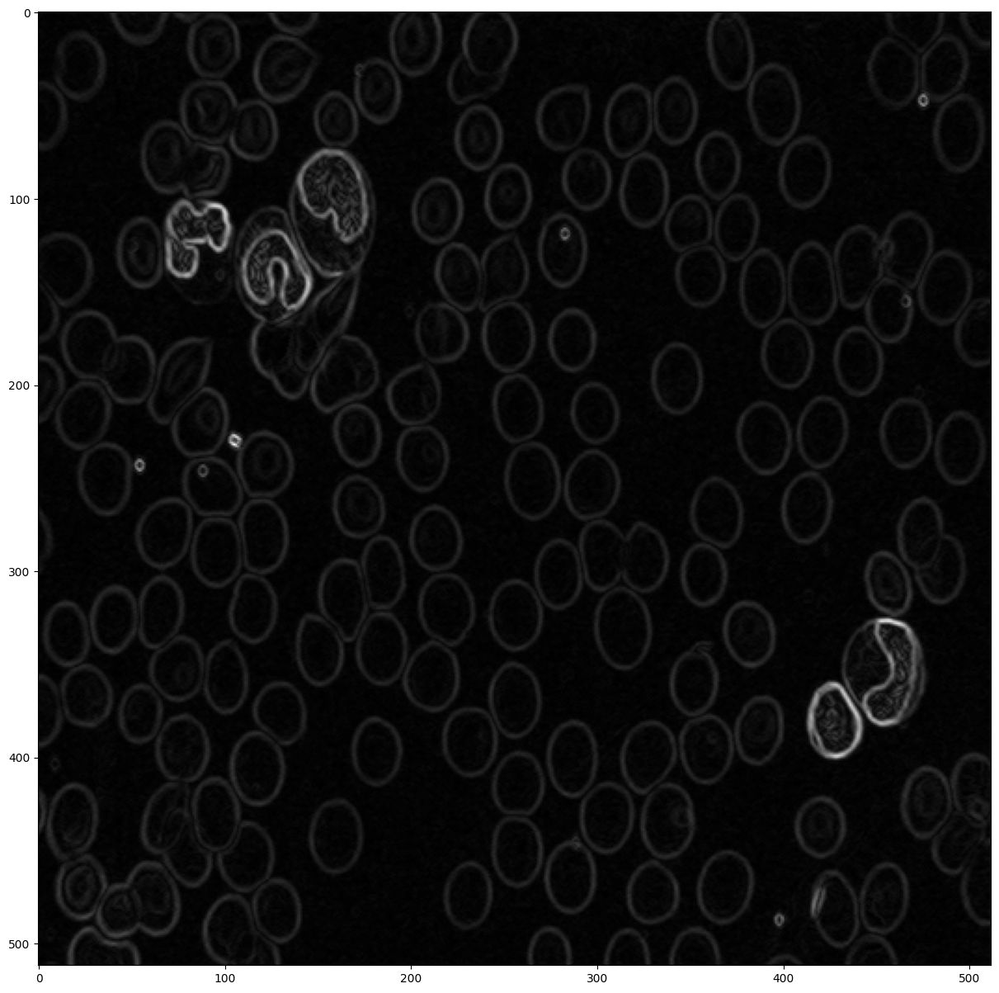

In [16]:
if student : 
    strell = morpho.disk(1)
    img = skio.imread("images/cell.tif")
    morpho_grad = morpho.dilation(img,strell)-morpho.erosion(img,strell)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) Finding an appropriate threshold value for the gradient can be challenging due to several factors. First, the choice of threshold value depends on the specific characteristics of the image and the objects of interest, which can vary widely. Second, noise and variations in lighting can affect the pixel intensities in the gradient, making it hard to determine a single threshold that works consistently across all images. Additionally, the sharpness and contrast of object boundaries can also vary, further complicating the threshold selection. Therefore, finding a universal threshold value that accurately separates objects from the background in all cases is often elusive, and it may require experimentation or adaptive thresholding methods to account for image-specific variations.

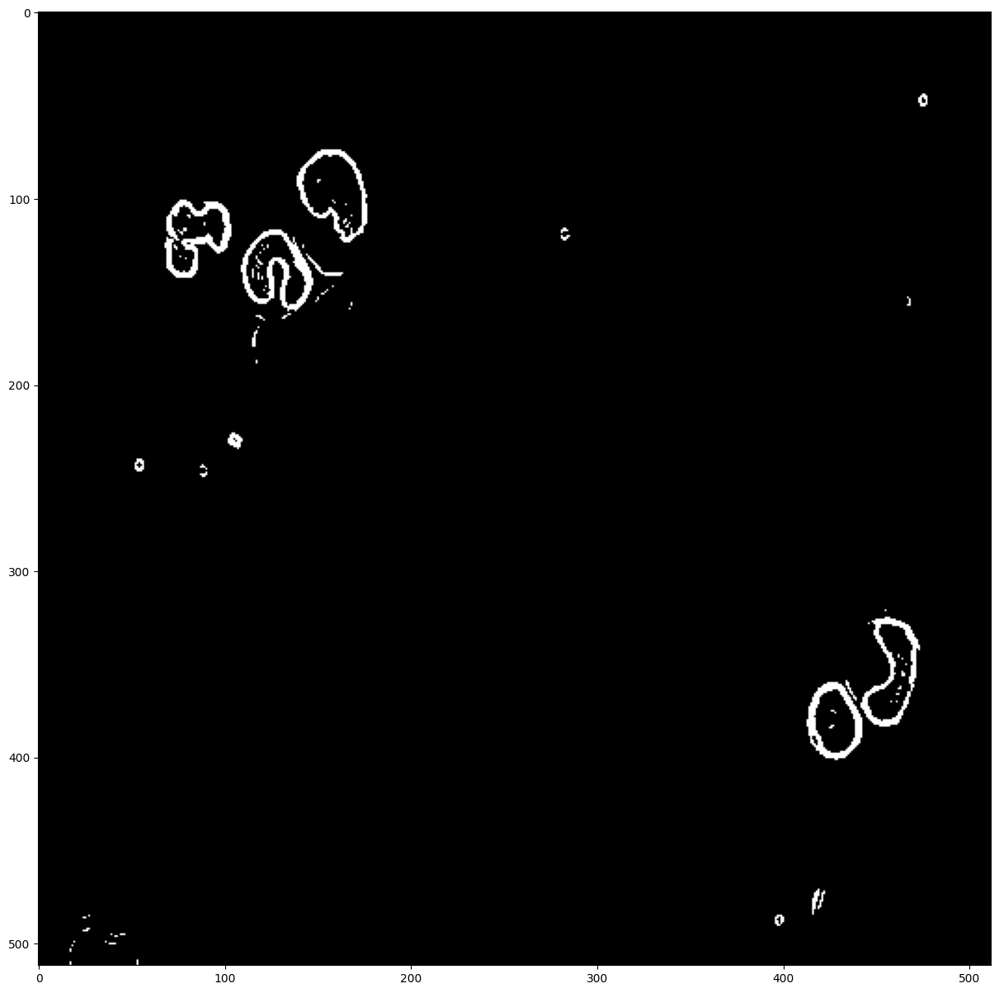

In [17]:
if student :
  thresh_grad = np.where(morpho_grad > 25, 255, 0)
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell)  I observe that it segments the image into regions based on intensity gradients, creating boundaries at places with significant changes in intensity. This allows for the identification of distinct objects or regions within the image, making it useful for image segmentation and object recognition tasks.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) The parameter "k" in the watershed algorithm plays a crucial role in defining the sensitivity of the segmentation. Increasing "k" tends to produce coarser segments with fewer regions, while decreasing it results in finer segmentation with more regions. It acts as a control for the threshold of gradient values, affecting the balance between over-segmentation and under-segmentation in the final image segmentation result. Adjusting "k" allows users to tailor the segmentation to their specific image analysis needs.

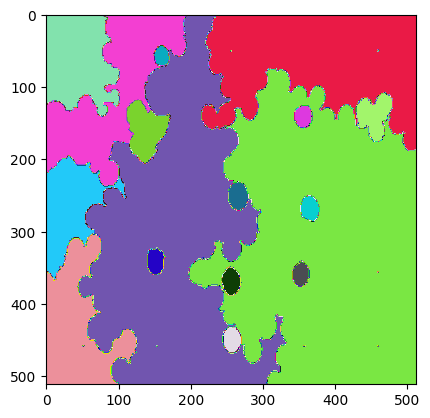

In [18]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  k = 25
  wat = seg.watershed(morpho_grad, k)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) Applying a closing operation to the gradient image before performing the watershed algorithm can lead to a better result in certain cases. Closing can help connect nearby gradients and reduce the likelihood of oversegmentation, resulting in more coherent object boundaries. It can help merge small, closely spaced objects that might have been unnecessarily split without closing. The specific improvement depends on the characteristics of the image and the desired segmentation outcome. In scenarios where objects are close or touching, closing followed by watershed can produce more accurate and cohesive segmentation results.
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) 
Applying an opening with the same structuring element on the gradient image before the watershed operation has a different effect compared to using closing. Opening tends to remove small details and can lead to the separation of closely connected objects in the gradient image. When followed by watershed, this process can result in a more fine-grained segmentation, potentially splitting objects that were closely connected in the original gradient image. The specific choice between opening and closing in combination with watershed depends on the desired level of segmentation detail and the characteristics of the objects and image.

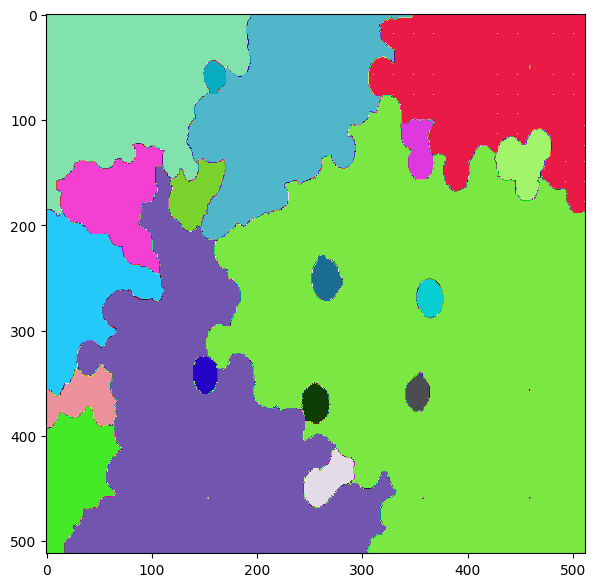

In [19]:
if student :
  k = 25
  wat_closing =  seg.watershed(morpho.closing(morpho_grad,morpho.disk(3)), k)
plt.figure(figsize =(7,7))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

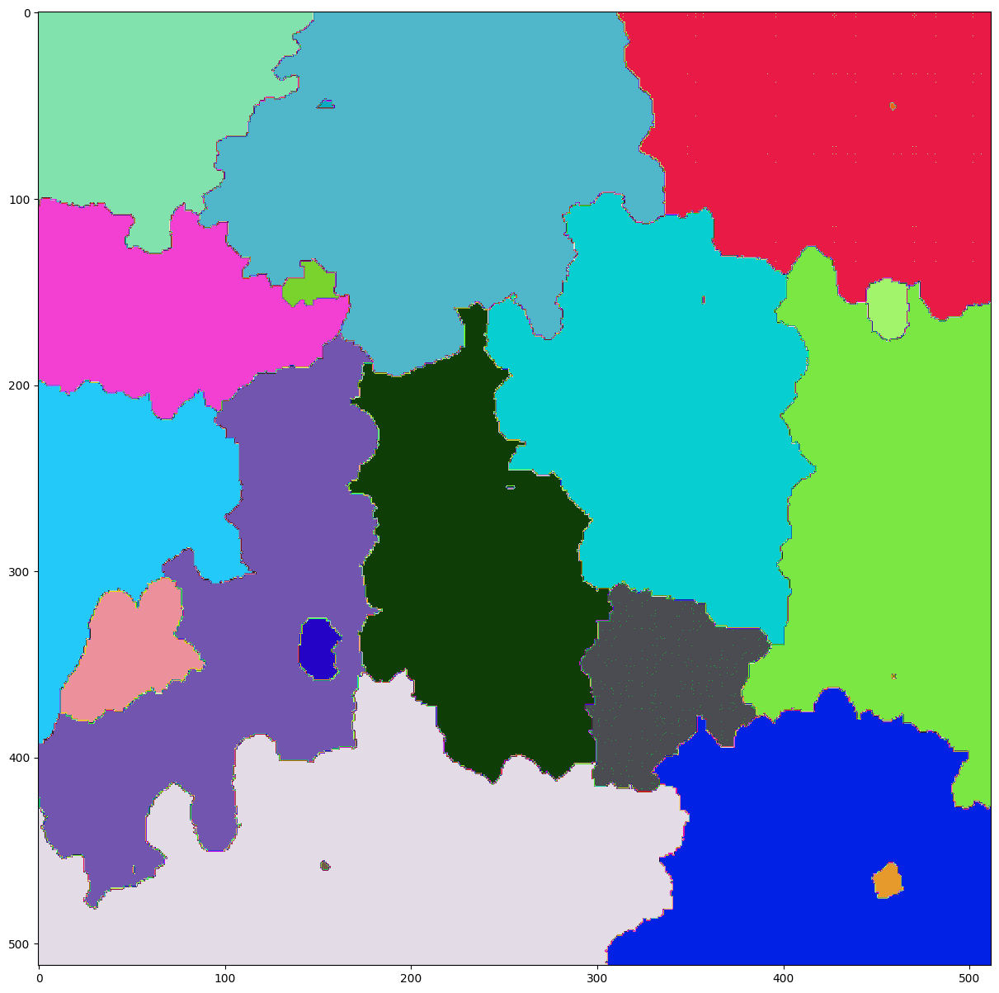

In [20]:
if student :
  wat_opening =  seg.watershed(morpho.opening(morpho_grad,morpho.disk(3)), k)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : This process helps by effectively eliminating small details and noise while preserving the larger structures, making the cells more prominent. It aids in efficient cell segmentation by enhancing the contrast between cells and the background. The approach is particularly useful when cells are relatively large compared to the noise or finer details in the image. This technique simplifies the image, making it more amenable to subsequent segmentation steps, potentially streamlining the cell segmentation process.

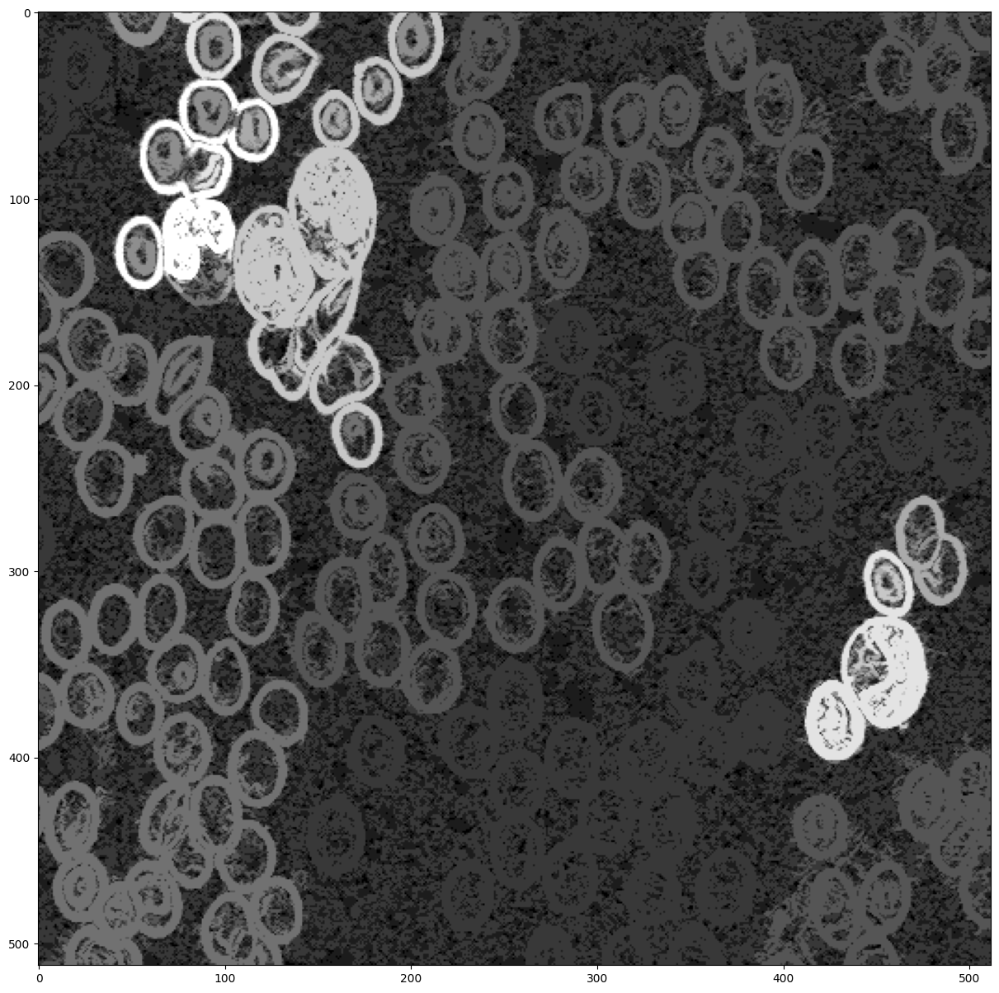

In [21]:
strell = morpho.disk(5)
imOpen = morpho.opening(morpho_grad, strell)
reco= morpho.reconstruction(imOpen, morpho_grad)
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : Computing the reconstruction from a closing of the gradient using a disk structuring element of size 5 may not be as effective in cell segmentation as opening of the gradient. Closing preserves the larger structures while potentially losing finer details, which may not be ideal for segmenting cells. It might result in cells appearing more merged or connected in the reconstructed image. To efficiently segment cells, emphasizing cell boundaries and reducing background noise, using the reconstruction from an opening of the gradient is generally a more suitable approach. This helps make cells more distinct and facilitates subsequent cell segmentation tasks.

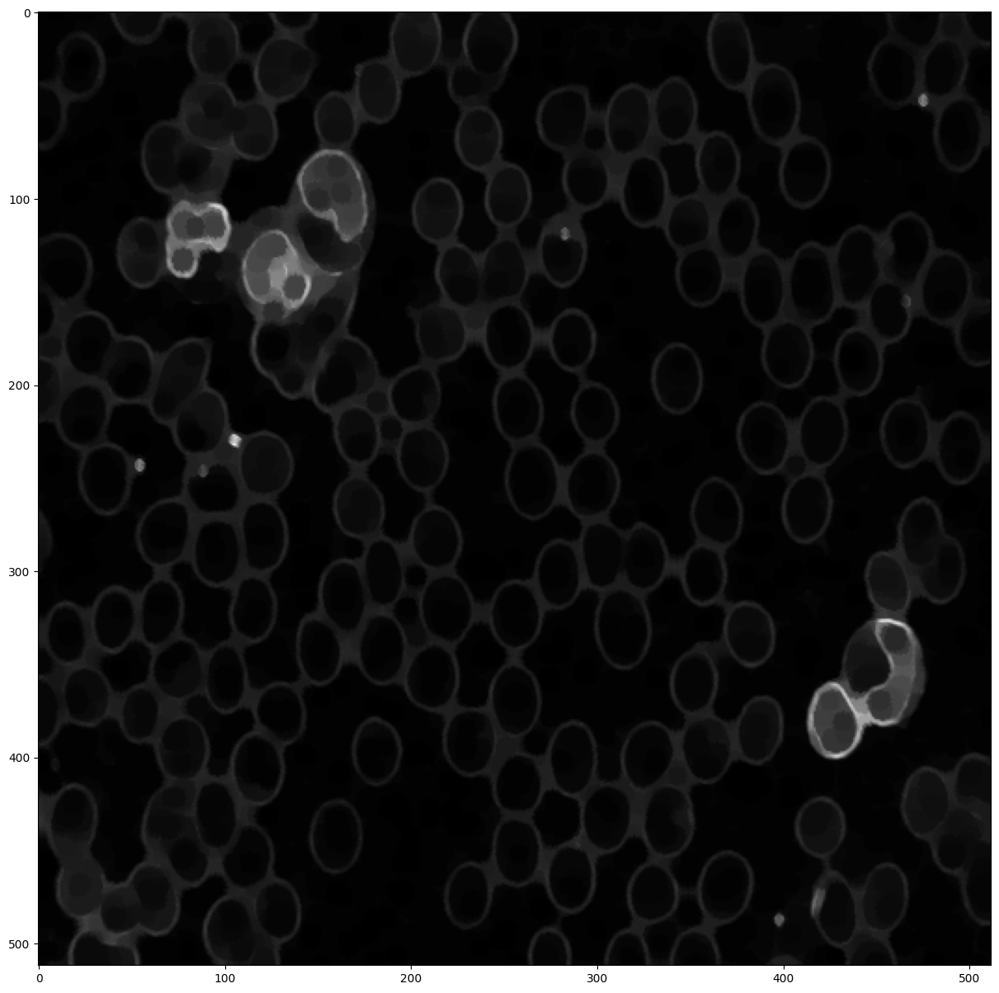

In [22]:
strell = morpho.disk(5)
imClos =  morpho.closing(morpho_grad, strell)
reco= morpho.reconstruction(morpho_grad, imClos )

plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

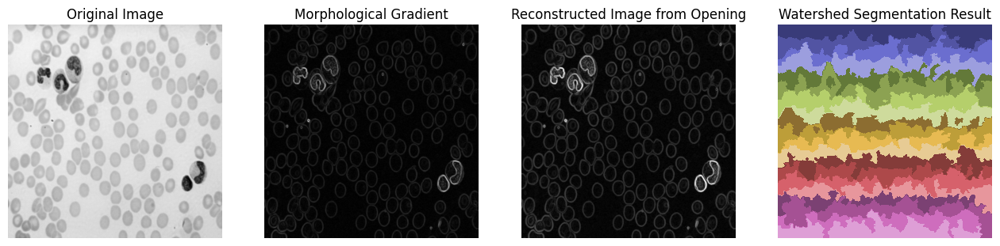

In [41]:
from scipy import ndimage

img = skio.imread("images/cell.tif")
# Define a structuring element (e.g., a disk with radius 1)
selem = morpho.disk(1)

# Perform dilation
dilated_image = morpho.dilation(img, selem)

# Perform erosion
eroded_image = morpho.erosion(img, selem)

# Calculate the morphological gradient (difference between dilation and erosion)
morphological_gradient = dilated_image - eroded_image

# Open the morphological gradient
opened_gradient = morpho.opening(morphological_gradient, selem)

# Reconstruct from the opening
reconstructed_image = morpho.reconstruction(opened_gradient, morphological_gradient)

# Find markers using the peak_local_max function
markers = feature.peak_local_max(opened_gradient, min_distance=10)

# Create a binary marker image with the same shape as the original image
marker_image = np.zeros_like(img)

for marker in markers:
    marker_image[marker[0], marker[1]] = 1

# Label the markers using scipy.ndimage.label
marker_labels, num_markers = ndimage.label(marker_image)

# Apply the watershed algorithm using the markers
watershed_labels = seg.watershed(-morphological_gradient, marker_labels)

# Display the original image, the morphological gradient, the reconstructed image, and the watershed result
fig, axes = plt.subplots(1, 4, figsize=(16, 5))
ax = axes.ravel()

ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(morphological_gradient, cmap='gray')
ax[1].set_title('Morphological Gradient')

ax[2].imshow(reconstructed_image, cmap='gray')
ax[2].set_title('Reconstructed Image from Opening')

ax[3].imshow(watershed_labels, cmap='tab20b')
ax[3].set_title('Watershed Segmentation Result')

for a in ax:
    a.axis('off')

plt.show()